In [1]:
import matplotlib.pyplot as plt
import datetime as dt
import pandas as pd
import numpy as np

from pathlib import Path
import soundfile as sf
import fsspec


In [2]:
def plot_audio_seg_spectrogram(audio_features, spec_features):
    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    vmax = spec_features['vmax']
    vmin = spec_features['vmin']
    cmap = spec_features['cmap']
    nfft = spec_features['NFFT']

    plt.figure(figsize=(15, 5))
    plt.rcParams.update({'font.size': 18})
    plt.title(f"Spectrogram", fontsize=24)
    plt.specgram(audio_seg+1e-6, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')
    plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plot_xtype = 'float'
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 11), 
            labels=np.round(np.linspace(start, start+duration, 11, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")
    plt.colorbar()
    plt.show()

In [3]:
filesys = fsspec.filesystem('s3', anon=True, client_kwargs={'endpoint_url': 'https://sdsc.osn.xsede.org'})
osn_file_path = Path(f'bio230143-bucket01/ubna_data_08/recover-20260824')

In [4]:
valid_wav_files = filesys.glob(f"{osn_file_path}/*/20260820_200000.WAV")
valid_wav_files

['bio230143-bucket01/ubna_data_08/recover-20260824/STF_001/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_004/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_006/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_018/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_019/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_023/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_029/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_031/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_032/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_033/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_034/20260820_200000.WAV',
 'bio230143-bucket01/ubna_data_08/recover-20260824/STF_035/20260820_200000.WAV',
 'bio230143-bucket01/ubna_da

In [5]:
SD_CARD_TO_AUDIOMOTH_NUM = {
    'STF_059': '001', 'STF_001': '002', 'STF_029': '003', 'STF_082': '004', 'STF_019': '005',
    'STF_083': '006', 'STF_031': '007', 'STF_079': '008', 'STF_054': '009', 'STF_032': '010',
    'STF_004': '011', 'STF_064': '012', 'STF_033': '013', 'STF_118': '014', 'STF_058': '015',
    'STF_034': '016', 'STF_018': '017', 'STF_075': '018', 'STF_084': '019', 'STF_051': '020',
    'STF_035': '021', 'STF_065': '022', 'STF_086': '023', 'STF_006': '024', 'STF_074': '025',
    'STF_073': '026', 'STF_081': '027', 'STF_038': '028', 'STF_093': '029', 'STF_085': '030',
    'STF_107': '031', 'STF_115': '032', 'STF_023': '033', 'STF_111': '034', 'STF_077': '035',
    'STF_088': '036', 'STF_070': '037', 'STF_101': '038', 'STF_087': '039', 'STF_091': '040',
    'STF_055': '041', 'STF_102': '042', 'STF_112': '043', 'STF_003': '044', 'STF_052': '045',
    'STF_108': '046', 'STF_076': '047', 'STF_061': '048', 'STF_095': '049', 'STF_039': '050',
    'STF_071': '051'}
SD_CARD_TO_AUDIOMOTH_NUM

{'STF_059': '001',
 'STF_001': '002',
 'STF_029': '003',
 'STF_082': '004',
 'STF_019': '005',
 'STF_083': '006',
 'STF_031': '007',
 'STF_079': '008',
 'STF_054': '009',
 'STF_032': '010',
 'STF_004': '011',
 'STF_064': '012',
 'STF_033': '013',
 'STF_118': '014',
 'STF_058': '015',
 'STF_034': '016',
 'STF_018': '017',
 'STF_075': '018',
 'STF_084': '019',
 'STF_051': '020',
 'STF_035': '021',
 'STF_065': '022',
 'STF_086': '023',
 'STF_006': '024',
 'STF_074': '025',
 'STF_073': '026',
 'STF_081': '027',
 'STF_038': '028',
 'STF_093': '029',
 'STF_085': '030',
 'STF_107': '031',
 'STF_115': '032',
 'STF_023': '033',
 'STF_111': '034',
 'STF_077': '035',
 'STF_088': '036',
 'STF_070': '037',
 'STF_101': '038',
 'STF_087': '039',
 'STF_091': '040',
 'STF_055': '041',
 'STF_102': '042',
 'STF_112': '043',
 'STF_003': '044',
 'STF_052': '045',
 'STF_108': '046',
 'STF_076': '047',
 'STF_061': '048',
 'STF_095': '049',
 'STF_039': '050',
 'STF_071': '051'}

In [6]:
AUDIOMOTH_AT_PATCHA = {
    '015': 'A1 (left)',  '014': 'A1 (right)', '050': 'A2 (left)',  '001': 'A2 (right)', '003': 'A3 (left)',
    '002': 'A3 (right)', '017': 'A4 (left)',  '016': 'A4 (right)', '013': 'A5 (left)',  '012': 'A5 (right)',
    '005': 'A6 (left)',  '004': 'A6 (right)', '018': 'A7 (left)',  '019': 'A7 (right)', '023': 'A8 (left)',
    '022': 'A8 (right)', '027': 'A9 (left)',  '026': 'A9 (right)', '020': 'A10 (left)', '021': 'A10 (right)'}

AUDIOMOTH_AT_PATCHE = {
    '024': 'E1 (left)',  '025': 'E1 (right)', '006': 'E2 (left)',  '007': 'E2 (right)', '047': 'E3 (left)',
    '046': 'E3 (right)', '036': 'E4 (left)',  '037': 'E4 (right)', '034': 'E5 (left)',  '035': 'E5 (right)'}

AUDIOMOTH_AT_PATCHB = {'010': 'B1 (left)', '011': 'B1 (right)', '008': 'B2 (left)', '009': 'B2 (right)'}

AUDIOMOTH_AT_PATCHC = {
    '031': 'C1 (left)',  '030': 'C1 (right)', '029': 'C2 (left)',  '028': 'C2 (right)', '048': 'C3 (left)',
    '049': 'C3 (right)', '033': 'C4 (left)',  '032': 'C4 (right)', '045': 'C5 (left)',  '051': 'C5 (right)',
    '038': 'C6 (left)',  '039': 'C6 (right)', '041': 'C7 (left)',  '040': 'C7 (right)', '042': 'C8 (left)',
    '043': 'C8 (right)' }

AUDIOMOTH_AT_ALLPATCHES = (AUDIOMOTH_AT_PATCHA | AUDIOMOTH_AT_PATCHB | AUDIOMOTH_AT_PATCHC | AUDIOMOTH_AT_PATCHE)

In [7]:
FREQ_UPPER_LIM = 4/8

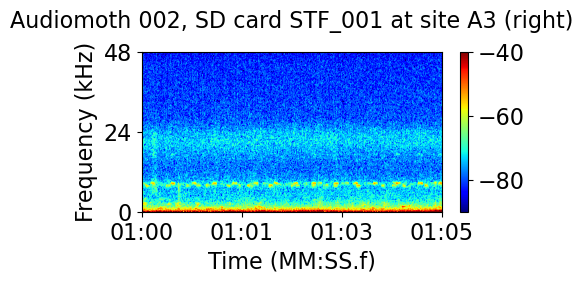

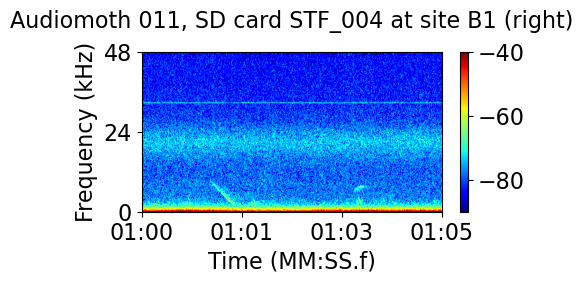

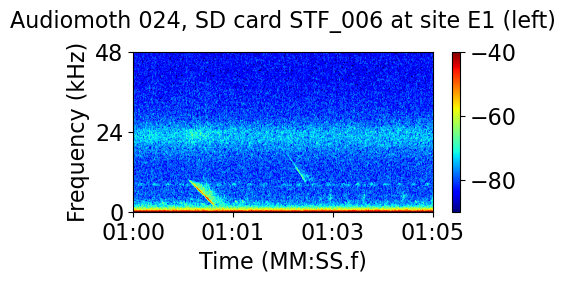

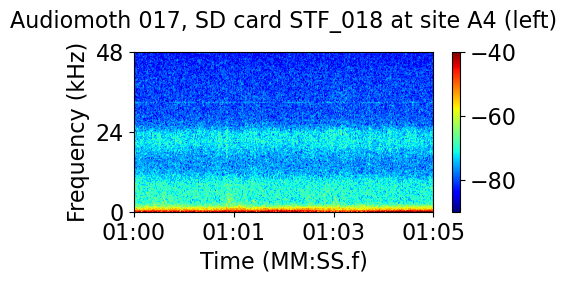

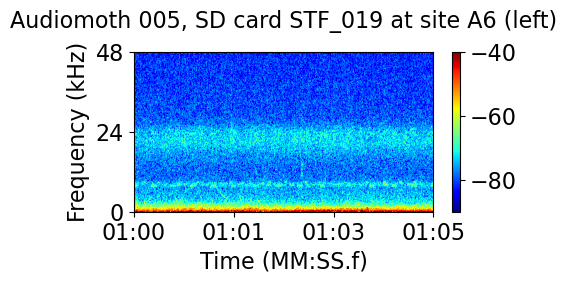

...

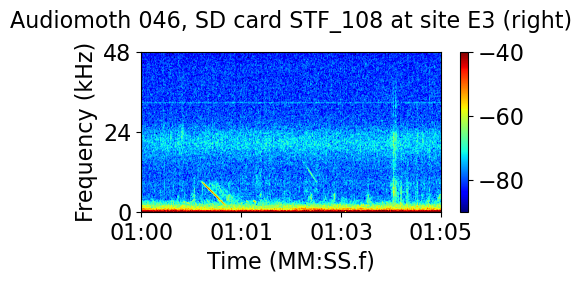

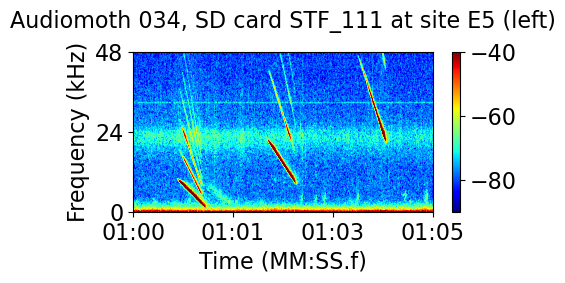

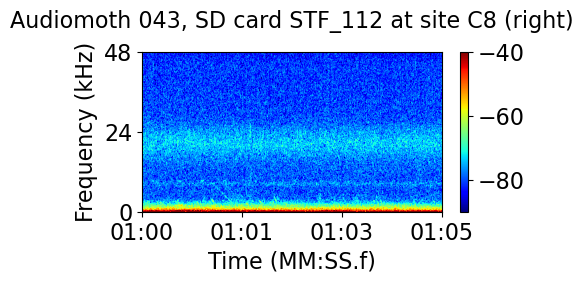

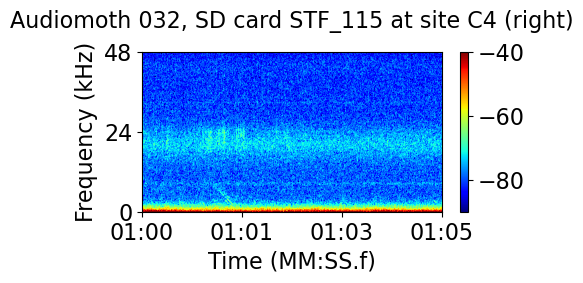

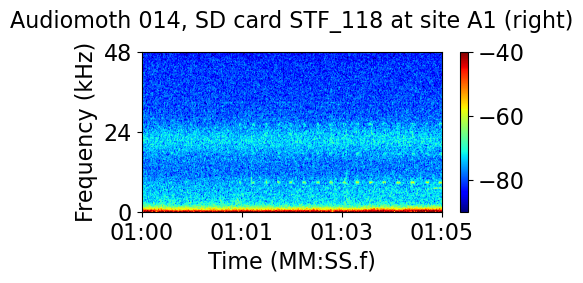

In [22]:
recording_start_dt = dt.datetime(2026, 8, 20, 20, 1, 0, 0)
recording_start_string = (recording_start_dt - dt.timedelta(hours=7)).strftime('%H:%M:%S')
SAMPLERATE = 192000

i = 0
audio_segs = dict()
for example_wav_file in valid_wav_files:
    example_wav_file_path = Path(example_wav_file)
    wav_SD_card = example_wav_file_path.parts[-2]
    wav_AUDIOMOTH = SD_CARD_TO_AUDIOMOTH_NUM[wav_SD_card]
    if wav_AUDIOMOTH not in AUDIOMOTH_AT_ALLPATCHES.keys():
        continue
    example_wav_file_dt = dt.datetime.strptime(example_wav_file_path.name, '%Y%m%d_%H%M%S.WAV')
    samples_until_recording_start = (recording_start_dt - example_wav_file_dt).total_seconds()
    recorded_audio = sf.SoundFile(filesys.open(example_wav_file_path, 'rb'))
    read_offset = samples_until_recording_start
    read_duration_in_secs = 5
    recorded_audio.seek(int(SAMPLERATE*read_offset))
    audio_seg = recorded_audio.read(int(SAMPLERATE*read_duration_in_secs))
    audio_segs[wav_AUDIOMOTH] = audio_seg

    vmax = -40
    vmin = -90

    audio_features = dict()
    audio_features['audio_seg'] = audio_seg
    audio_features['sample_rate'] = SAMPLERATE
    audio_features['start'] = read_offset
    audio_features['duration'] = read_duration_in_secs

    spec_features = dict()
    spec_features['NFFT'] = 1024 # When segments are short, NFFT should also be small to best see calls (must always be > 128)
    spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
    spec_features['vmin'] = vmin
    spec_features['vmax'] = vmax

    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    vmax = spec_features['vmax']
    vmin = spec_features['vmin']
    cmap = spec_features['cmap']
    nfft = spec_features['NFFT']

    fig, ax = plt.subplots(1, 1, figsize=(5, 3.2))
    plt.rcParams.update({'font.size': 16})

    ax.set_title(f"Audiomoth {wav_AUDIOMOTH}, SD card {wav_SD_card} at site {AUDIOMOTH_AT_ALLPATCHES[wav_AUDIOMOTH]}", y=1.1, fontsize=16)
    spec, freqs, t, im = ax.specgram(audio_seg+1e-6, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')
    ax.set_yticks(ticks=np.linspace(0, FREQ_UPPER_LIM, 3), labels=np.linspace(0, FREQ_UPPER_LIM * (fs/2000), 3).astype('int'))
    ax.set_ylim(0, FREQ_UPPER_LIM)
    times = []
    for s in np.linspace(0, duration, 4):
        times += [str(dt.datetime.strftime(recording_start_dt + dt.timedelta(seconds=float(s)), "%M:%S"))]
    ax.set_xticks(ticks=np.linspace(0, duration*(fs/2), 4), labels=times, rotation=0)
    fig.colorbar(im, ax=ax)
    ax.set_ylabel("Frequency (kHz)")
    ax.set_xlabel("Time (MM:SS.f)") 

    fig.tight_layout()
    plt.show()

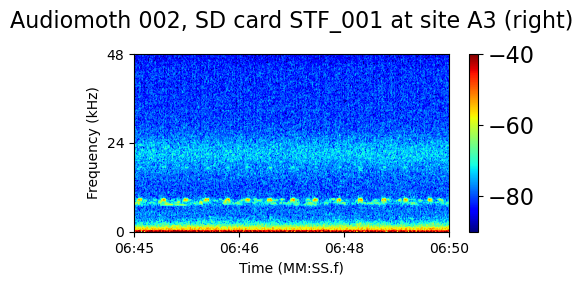

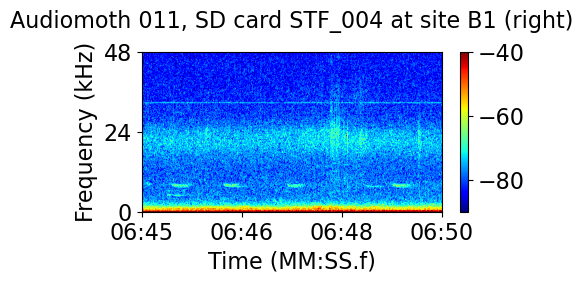

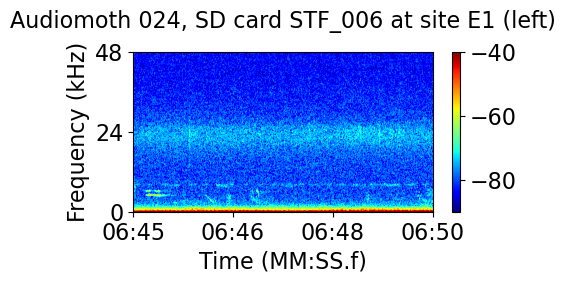

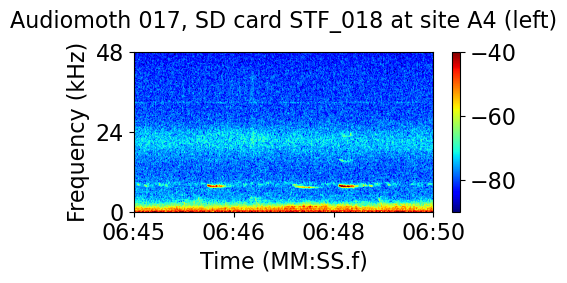

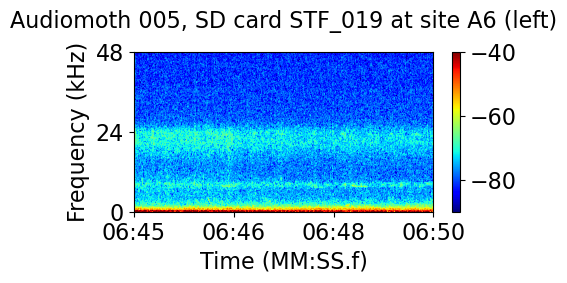

...

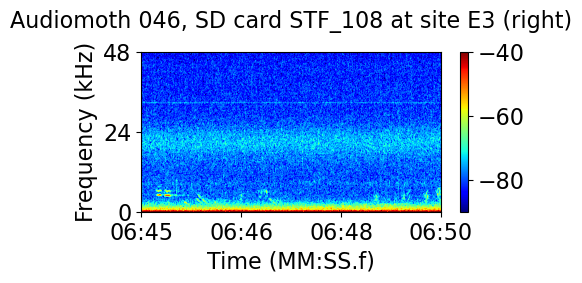

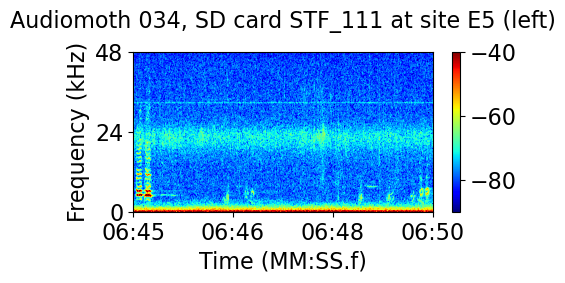

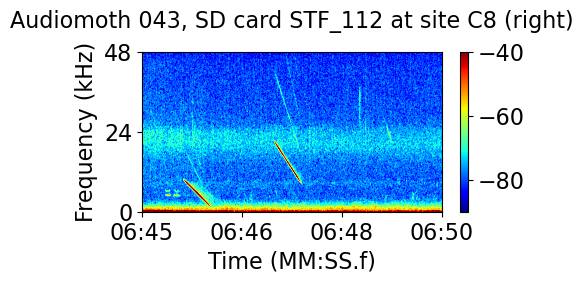

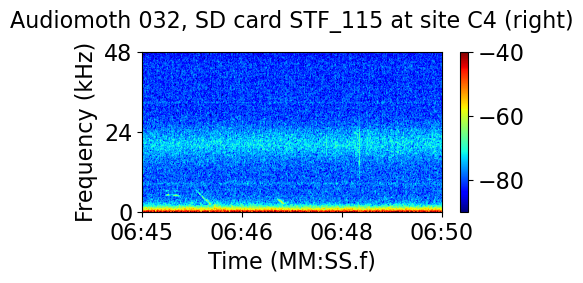

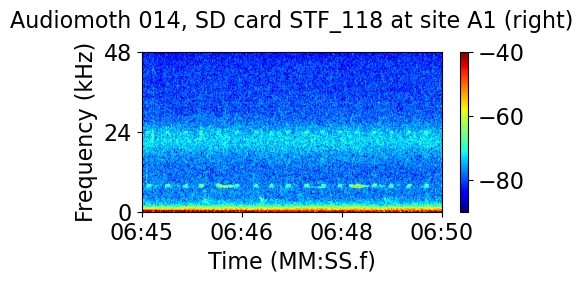

In [8]:
recording_start_dt = dt.datetime(2026, 8, 20, 20, 6, 45, 0)
recording_start_string = (recording_start_dt - dt.timedelta(hours=7)).strftime('%H:%M:%S')
SAMPLERATE = 192000

i = 0
audio_segs = dict()
for example_wav_file in valid_wav_files:
    example_wav_file_path = Path(example_wav_file)
    wav_SD_card = example_wav_file_path.parts[-2]
    wav_AUDIOMOTH = SD_CARD_TO_AUDIOMOTH_NUM[wav_SD_card]
    if wav_AUDIOMOTH not in AUDIOMOTH_AT_ALLPATCHES.keys():
        continue
    example_wav_file_dt = dt.datetime.strptime(example_wav_file_path.name, '%Y%m%d_%H%M%S.WAV')
    samples_until_recording_start = (recording_start_dt - example_wav_file_dt).total_seconds()
    recorded_audio = sf.SoundFile(filesys.open(example_wav_file_path, 'rb'))
    read_offset = samples_until_recording_start
    read_duration_in_secs = 5
    recorded_audio.seek(int(SAMPLERATE*read_offset))
    audio_seg = recorded_audio.read(int(SAMPLERATE*read_duration_in_secs))
    audio_segs[wav_AUDIOMOTH] = audio_seg

    vmax = -40
    vmin = -90

    audio_features = dict()
    audio_features['audio_seg'] = audio_seg
    audio_features['sample_rate'] = SAMPLERATE
    audio_features['start'] = read_offset
    audio_features['duration'] = read_duration_in_secs

    spec_features = dict()
    spec_features['NFFT'] = 1024 # When segments are short, NFFT should also be small to best see calls (must always be > 128)
    spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
    spec_features['vmin'] = vmin
    spec_features['vmax'] = vmax

    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    vmax = spec_features['vmax']
    vmin = spec_features['vmin']
    cmap = spec_features['cmap']
    nfft = spec_features['NFFT']

    fig, ax = plt.subplots(1, 1, figsize=(5, 3.2))
    plt.rcParams.update({'font.size': 16})

    ax.set_title(f"Audiomoth {wav_AUDIOMOTH}, SD card {wav_SD_card} at site {AUDIOMOTH_AT_ALLPATCHES[wav_AUDIOMOTH]}", y=1.1, fontsize=16)
    spec, freqs, t, im = ax.specgram(audio_seg+1e-6, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')
    ax.set_yticks(ticks=np.linspace(0, FREQ_UPPER_LIM, 3), labels=np.linspace(0, FREQ_UPPER_LIM * (fs/2000), 3).astype('int'))
    ax.set_ylim(0, FREQ_UPPER_LIM)
    times = []
    for s in np.linspace(0, duration, 4):
        times += [str(dt.datetime.strftime(recording_start_dt + dt.timedelta(seconds=float(s)), "%M:%S"))]
    ax.set_xticks(ticks=np.linspace(0, duration*(fs/2), 4), labels=times, rotation=0)
    fig.colorbar(im, ax=ax)
    ax.set_ylabel("Frequency (kHz)")
    ax.set_xlabel("Time (MM:SS.f)") 

    fig.tight_layout()
    plt.show()

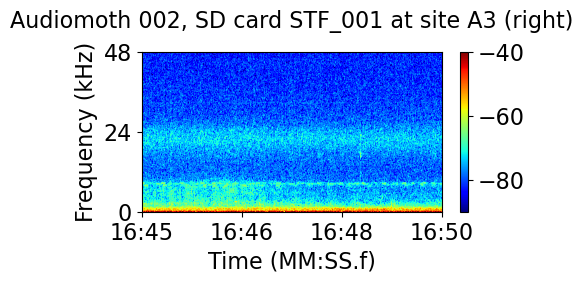

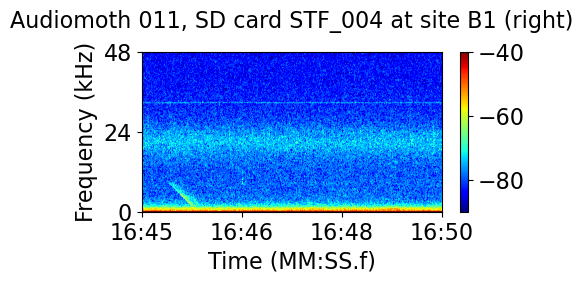

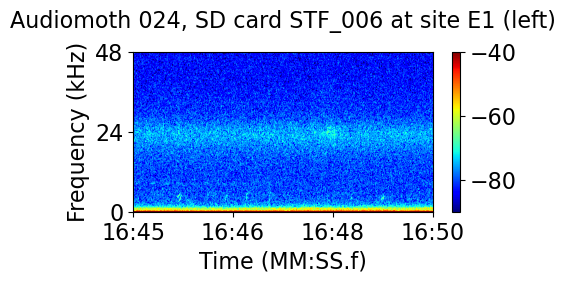

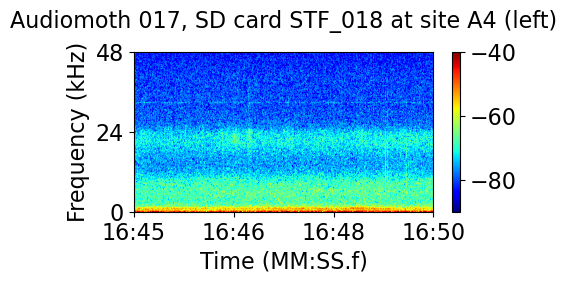

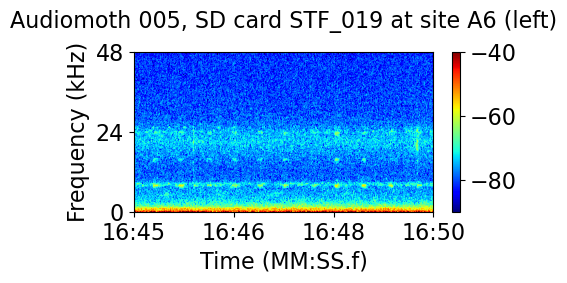

...

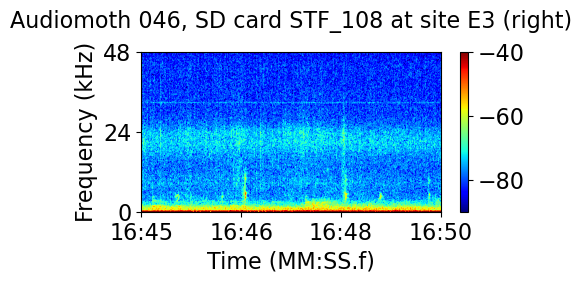

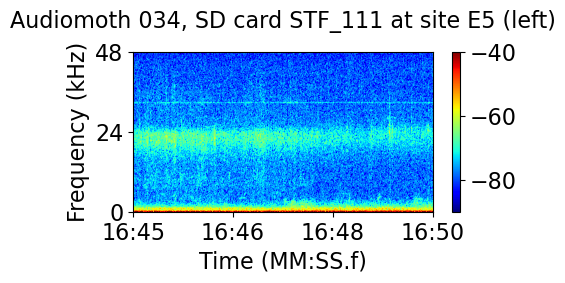

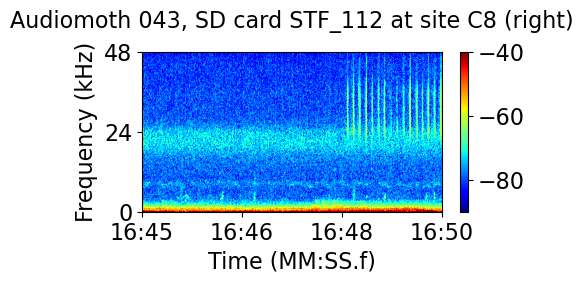

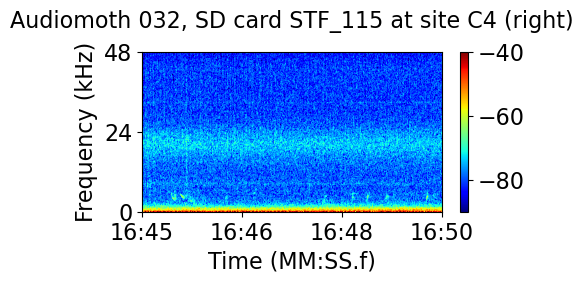

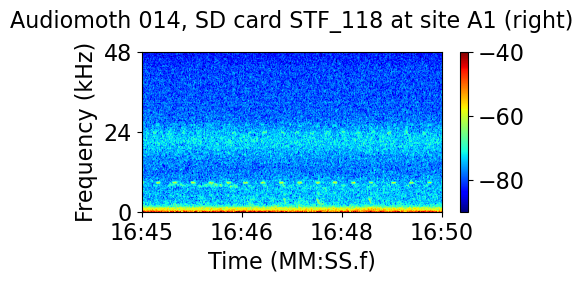

In [25]:
recording_start_dt = dt.datetime(2026, 8, 20, 20, 16, 45, 0)
recording_start_string = (recording_start_dt - dt.timedelta(hours=7)).strftime('%H:%M:%S')
SAMPLERATE = 192000

i = 0
audio_segs = dict()
for example_wav_file in valid_wav_files:
    example_wav_file_path = Path(example_wav_file)
    wav_SD_card = example_wav_file_path.parts[-2]
    wav_AUDIOMOTH = SD_CARD_TO_AUDIOMOTH_NUM[wav_SD_card]
    if wav_AUDIOMOTH not in AUDIOMOTH_AT_ALLPATCHES.keys():
        continue
    example_wav_file_dt = dt.datetime.strptime(example_wav_file_path.name, '%Y%m%d_%H%M%S.WAV')
    samples_until_recording_start = (recording_start_dt - example_wav_file_dt).total_seconds()
    recorded_audio = sf.SoundFile(filesys.open(example_wav_file_path, 'rb'))
    read_offset = samples_until_recording_start
    read_duration_in_secs = 5
    recorded_audio.seek(int(SAMPLERATE*read_offset))
    audio_seg = recorded_audio.read(int(SAMPLERATE*read_duration_in_secs))
    audio_segs[wav_AUDIOMOTH] = audio_seg

    vmax = -40
    vmin = -90

    audio_features = dict()
    audio_features['audio_seg'] = audio_seg
    audio_features['sample_rate'] = SAMPLERATE
    audio_features['start'] = read_offset
    audio_features['duration'] = read_duration_in_secs

    spec_features = dict()
    spec_features['NFFT'] = 1024 # When segments are short, NFFT should also be small to best see calls (must always be > 128)
    spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
    spec_features['vmin'] = vmin
    spec_features['vmax'] = vmax

    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    duration = audio_features['duration']

    vmax = spec_features['vmax']
    vmin = spec_features['vmin']
    cmap = spec_features['cmap']
    nfft = spec_features['NFFT']

    fig, ax = plt.subplots(1, 1, figsize=(5, 3.2))
    plt.rcParams.update({'font.size': 16})

    ax.set_title(f"Audiomoth {wav_AUDIOMOTH}, SD card {wav_SD_card} at site {AUDIOMOTH_AT_ALLPATCHES[wav_AUDIOMOTH]}", y=1.1, fontsize=16)
    spec, freqs, t, im = ax.specgram(audio_seg+1e-6, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')
    ax.set_yticks(ticks=np.linspace(0, FREQ_UPPER_LIM, 3), labels=np.linspace(0, FREQ_UPPER_LIM * (fs/2000), 3).astype('int'))
    ax.set_ylim(0, FREQ_UPPER_LIM)
    times = []
    for s in np.linspace(0, duration, 4):
        times += [str(dt.datetime.strftime(recording_start_dt + dt.timedelta(seconds=float(s)), "%M:%S"))]
    ax.set_xticks(ticks=np.linspace(0, duration*(fs/2), 4), labels=times, rotation=0)
    fig.colorbar(im, ax=ax)
    ax.set_ylabel("Frequency (kHz)")
    ax.set_xlabel("Time (MM:SS.f)") 

    fig.tight_layout()
    plt.show()